# Sydney Data - Wrangling, Analysis and Insights

## Data Wrangling

In [79]:
# Import the necessary libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Load the bicycle_survey and bicycle_sites csv as Dataframes.
bicycle_survey = pd.read_csv("Bicycle_count_surveys.csv")
bicycle_site = pd.read_csv("Bicycle_count_sites.csv")

In [4]:
# View the each DataFrame.
bicycle_survey.head()

,SiteID,Month,Year,TotalCount,ObjectId2,Time_0600,Time_0700,Time_0800,Time_1600,Time_1700,Time_1800
0,51,March,2010,263,1,12,45,56,27,56,67
1,1,October,2015,383,2,37,69,100,47,68,62
2,52,March,2010,136,3,7,18,31,29,30,21
3,53,March,2010,333,4,25,86,93,15,62,52
4,2,October,2015,447,5,32,75,72,56,114,98


In [5]:
# Rename the columns for easier understanding.
bicycle_survey.rename(columns = {"Time_0600":"0600-0700",
                              "Time_0700":"0700-0800",
                              "Time_0800":"0800-0900",
                              "Time_1600":"1600-1700",
                              "Time_1700":"1700-1800",
                              "Time_1800":"1800-1900"},
                             inplace=True)

# View the DataFrame.
bicycle_survey.head()

,SiteID,Month,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900
0,51,March,2010,263,1,12,45,56,27,56,67
1,1,October,2015,383,2,37,69,100,47,68,62
2,52,March,2010,136,3,7,18,31,29,30,21
3,53,March,2010,333,4,25,86,93,15,62,52
4,2,October,2015,447,5,32,75,72,56,114,98


In [11]:
bicycle_survey.isnull().sum()

SiteID                  0
Month                   0
Year                    0
TotalCount              0
ObjectId2               0
0600-0700               0
0700-0800               0
0800-0900               0
1600-1700               0
1700-1800               0
1800-1900               0
Difference_in_totals    0
dtype: int64

In [81]:
# Check for duplicate rows across all columns.
bicycle_survey[bicycle_survey.duplicated(keep="last")]

,SiteID,Month,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,Difference_in_totals


In [86]:
# Check for null values across the DataFrame.
bicycle_survey.isnull().sum().sum()

0

In [92]:
# The data looks clean - no null values or duplicate rows.
# A quick glance via filter in excel also shows no errors.

# Calcualte descriptive statistics.
bicycle_survey.describe()

,SiteID,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,Difference_in_totals
count,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000,2215.000000
mean,52.748081,2015.307449,499.086230,1126.790519,42.607223,88.642438,114.964334,56.424379,103.087133,92.879910,0.480813
std,30.012911,3.565469,485.023818,664.561662,60.945213,101.371594,117.587336,48.984111,99.571231,89.525962,22.000687
min,1.000000,2010.000000,19.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,-561.000000
25%,27.000000,2012.000000,193.000000,554.500000,14.000000,30.000000,40.000000,24.000000,40.000000,34.000000,0.000000
50%,53.000000,2015.000000,326.000000,1108.000000,25.000000,51.000000,73.000000,40.000000,68.000000,62.000000,0.000000
75%,79.000000,2018.000000,594.000000,1698.500000,47.000000,101.500000,146.000000,73.000000,129.000000,119.000000,0.000000
max,110.000000,2022.000000,2898.000000,2294.000000,948.000000,785.000000,787.000000,523.000000,591.000000,614.000000,479.000000


In [ ]:
# Calculate the number of outliers in each column.


In [6]:
# Create a new column showing the difference of total count and all the times.
bicycle_survey["Difference_in_totals"] = bicycle_survey["TotalCount"]\
                                        -bicycle_survey["0600-0700"]\
                                        -bicycle_survey["0700-0800"]\
                                        -bicycle_survey["0800-0900"]\
                                        -bicycle_survey["1600-1700"]\
                                        -bicycle_survey["1700-1800"]\
                                        -bicycle_survey["1800-1900"]
# View the DataFrame.
bicycle_survey.head()

,SiteID,Month,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,Difference_in_totals
0,51,March,2010,263,1,12,45,56,27,56,67,0
1,1,October,2015,383,2,37,69,100,47,68,62,0
2,52,March,2010,136,3,7,18,31,29,30,21,0
3,53,March,2010,333,4,25,86,93,15,62,52,0
4,2,October,2015,447,5,32,75,72,56,114,98,0


In [10]:
# Filter the DataFrame using Differences != 0.
# WE consider difference <> 0 as outliers or mistakes in the dataset.
bicycle_survey_outliers = bicycle_survey[bicycle_survey["Difference_in_totals"]!=0]

# View the dataset
bicycle_survey_outliers

,SiteID,Month,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,Difference_in_totals
13,7,October,2015,451,14,46,100,109,41,75,77,3
120,48,October,2015,226,121,23,37,48,26,45,46,1
239,40,October,2010,170,240,24,38,25,19,24,39,1
322,86,October,2015,868,323,59,171,207,101,180,148,2
328,40,March,2016,361,329,43,41,67,39,78,90,3
459,7,March,2017,527,460,51,96,149,56,111,71,-7
461,9,March,2017,714,462,22,64,84,33,57,51,403
542,40,October,2016,432,543,46,87,80,51,90,74,4
707,87,March,2011,361,708,29,81,87,37,70,58,-1
742,93,March,2011,312,743,10,35,58,29,63,57,60


Analysis: There are 28 records where the totals do not match up. For consistency purposes these will need to be removed.

In [24]:
# Filter the DataFrame using Differences = 0.
# WE consider difference <> 0 as outliers or mistakes in the dataset.
bicycle_survey_new = bicycle_survey[bicycle_survey["Difference_in_totals"]==0]

# Sort the dataset by Year in ascending order.
bicycle_survey_new.sort_values(by="Year",ascending=True)

,SiteID,Month,Year,TotalCount,ObjectId2,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,Difference_in_totals
0,51,March,2010,263,1,12,45,56,27,56,67,0
159,31,March,2010,211,160,15,18,41,31,56,50,0
160,32,March,2010,159,161,7,27,45,13,45,22,0
161,33,March,2010,243,162,23,41,70,22,46,41,0
162,34,March,2010,66,163,4,4,12,10,21,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2158,16,March,2022,320,2238,33,63,91,34,47,52,0
2157,11,March,2022,1525,2237,95,230,360,178,339,323,0
2155,110,March,2022,81,2235,6,10,18,11,20,16,0
2164,71,March,2022,872,2244,44,127,169,132,202,198,0


In [25]:
bicycle_site.head()

,X,Y,OBJECTID,SiteID,Intersection
0,151.204168,-33.882846,1,1,"Intersection of Broadway, Lee Street, Quay Str..."
1,151.208601,-33.878286,2,2,Intersection of Castlereagh Street and Goulbur...
2,151.205783,-33.863364,3,3,Intersection of Grosvenor Street and Glouceste...
3,151.209897,-33.873292,4,4,Intersection of Elizabeth Street and Park Street
4,151.209083,-33.879797,5,5,"Intersection of Elizabeth Street, Wentworth Av..."


In [26]:
# Join the two datasets for completeness.
bicycle_merge = pd.merge(bicycle_survey_new,bicycle_site,how="left")

In [27]:
bicycle_merge.shape

(2186, 16)

In [28]:
# Drop unnecessary columns from the merged DataFrame
bicycle_merge = bicycle_merge.drop(["ObjectId2","OBJECTID","Difference_in_totals"],axis=1)
bicycle_merge = bicycle_merge.drop(["Difference_in_totals"],axis=1)

KeyError: "['Difference_in_totals'] not found in axis"

In [29]:
# View the DataFrame.
bicycle_merge

,SiteID,Month,Year,TotalCount,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900,X,Y,Intersection
0,51,March,2010,263,12,45,56,27,56,67,151.178546,-33.884410,Intersection of Pyrmont Bridge Road and Lyons ...
1,1,October,2015,383,37,69,100,47,68,62,151.204168,-33.882846,"Intersection of Broadway, Lee Street, Quay Str..."
2,52,March,2010,136,7,18,31,29,30,21,151.175307,-33.883012,Intersection of Wigram Road and Booth Street
3,53,March,2010,333,25,86,93,15,62,52,151.188250,-33.876658,"Intersection of Bridge Road, Darling Street an..."
4,2,October,2015,447,32,75,72,56,114,98,151.208601,-33.878286,Intersection of Castlereagh Street and Goulbur...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2181,86,March,2022,998,72,134,236,138,235,183,151.215319,-33.887142,Intersection of Bourke Street and Phelps Street
2182,76,March,2022,856,59,160,191,103,177,166,151.191590,-33.870635,Intersection of Miller Street and Saunders Street
2183,79,March,2022,554,32,77,122,79,116,128,151.194928,-33.871425,Intersection of Pyrmont Bridge Road and Harris...
2184,82,March,2022,1018,42,156,244,143,227,206,151.202308,-33.891879,Intersection of George Street and Wells Street


In [30]:
# Subset the dataframe to retain relevant columns.
# We will identify any interesting SiteIDs and join them using the latitude, longitude or intersectoin date post-analysis.
bicycle_merge2 = bicycle_merge[["SiteID",
                                "Month",
                                "Year",
                                "TotalCount",
                                "0600-0700",
                                "0700-0800",
                                "0800-0900",
                               "1600-1700",
                                "1700-1800",
                                "1800-1900"]]

# View the dataframe.
bicycle_merge2.head()

,SiteID,Month,Year,TotalCount,0600-0700,0700-0800,0800-0900,1600-1700,1700-1800,1800-1900
0,51,March,2010,263,12,45,56,27,56,67
1,1,October,2015,383,37,69,100,47,68,62
2,52,March,2010,136,7,18,31,29,30,21
3,53,March,2010,333,25,86,93,15,62,52
4,2,October,2015,447,32,75,72,56,114,98


In [31]:
# Convert the table to long form to make make faceted visualisations.
bicycle_merge2 = bicycle_merge2.melt(id_vars=["SiteID",
                                              "Month",
                                              "Year",
                                              "TotalCount"],
                                     var_name="Time",
                                     value_name="Count")

In [32]:
# View the resultant dataframe.
bicycle_merge2

,SiteID,Month,Year,TotalCount,Time,Count
0,51,March,2010,263,0600-0700,12
1,1,October,2015,383,0600-0700,37
2,52,March,2010,136,0600-0700,7
3,53,March,2010,333,0600-0700,25
4,2,October,2015,447,0600-0700,32
...,...,...,...,...,...,...
13111,86,March,2022,998,1800-1900,183
13112,76,March,2022,856,1800-1900,166
13113,79,March,2022,554,1800-1900,128
13114,82,March,2022,1018,1800-1900,206


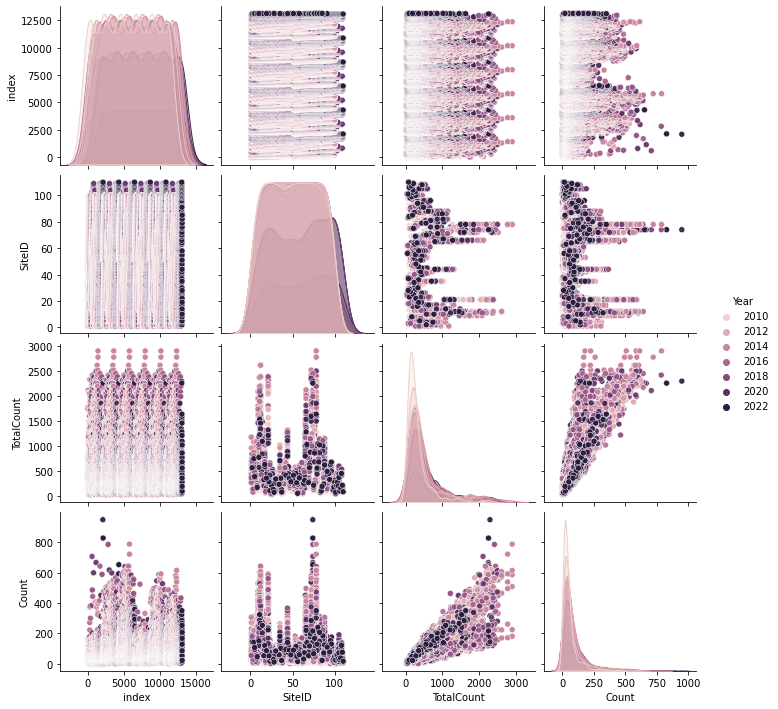

In [75]:
# Create a facetplot of row = TIme, column = year, hue = month
# Create a second one unique siteID groupings or longitude latitude groupings

sns.pairplot(data = bicycle_merge2,
            hue="Year")

Initially I thought a pairplot would be an easy solution to created a faceted chart, but this was not so as you still had to subset the dataframe. I thought it would be easier to go straight to a faceted plot using catplot instead.

# DATA VISUALISATION AND ANALYSIS

In [ ]:
# Create a faceted scatterplot showing how counts vary by site id over the years and time.
# For March Only.
bicycle_merge2_catplot_mar = sns.catplot(
                            x="SiteID",
                            y= "Count",
                            row= "Year",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2[bicycle_merge2["Month"]=="March"]) 

# Save the large visualisation for analysis.
bicyle_merge2_catplot_mar.figsave("Caplot1.jpg",dpi=480)

Observations: Most peaks occur somewhere in either low site IDs or higher end site IDs.There are some blanks indicating certain sites do not have data for a particular year or time. Most sites have very low cycle counts at 6am and 4pm, before peaking numbers increase from 7-9am and 5-7pm, respectively. In general the timings which provide the best peaks  consistently throughout the years are 7-9am and 5-7pm (read from top to bottom). 2022, 6am provides a striking outlier. What could have possible caused this? What can explain the variations in cyclist counts in each site? 

In [ ]:
# Create a faceted scatterplot showing how counts vary by site id over the years and time.
# For October Only.
bicycle_merge2_catplot_oct = sns.catplot(
                            x="SiteID",
                            y= "Count",
                            row= "Year",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2[bicycle_merge2["Month"]=="October"])

# Save the large visualisations for further analysis.
bicyle_merge2_catplot_oct.figsave("Caplot1.jpg",dpi=480)

Similar patterns observed in October as in March.

I initially thought using a facetplot and arranging it in this fashion would deliver insights. However upon analysis we can't analyse which sites are the most popular without having a super high resolution image which would take memory and be difficult to analyse at a glance.

I have opted to use a similar faceted plot but with different variables as below. 

We will aim to answer several key qiuestions, suchas:
- which sites have peaks, and after researching, what could be the possible reasons?
- which sites don't have peaks, and why?
- Is there a trend in either month or across years?
- what do sites which have peaks in cyclist counts have in common with London's data / context? Can these same situations be replicated? If not what we can we learn and apply in London?


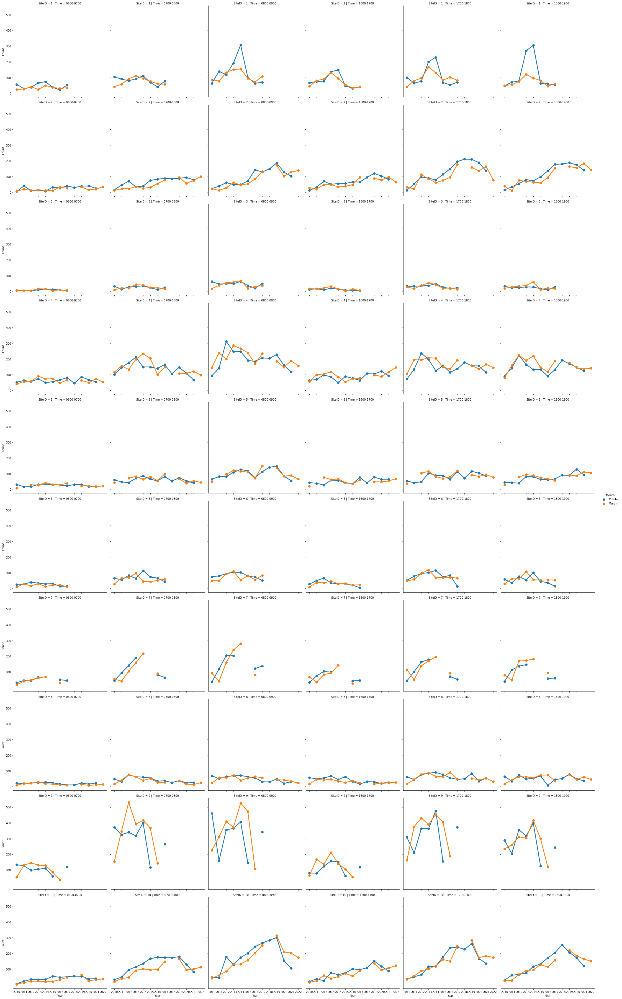

In [34]:
# Create a faceted scatterplot showing how counts vary over the years, faceted by site id and timings.
# Add month as a third variable.
# In here blue is October and March is Orange.
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            # Limit the siteIDs in roups of 10 by applying a filter in the data.
                            # Multiple conditions will utilise .query 
                            data=bicycle_merge2[bicycle_merge2["SiteID"]<11])

Observations

- Many sites have missing data over the years, indicating that the data isn't complete or that there was a problem with data collection.
- There is some variation with the total number of cyclists year-on-year as throughout the timings but they do not fluctuate a lot.
- Most (not all) of the graphs show a similar trend in terms of numbers of cyclists over Mar and Oct. These can be seen when the graphs overlap.
- It is a bit difficult to discern the effect of time on certain site IDs. Most graphs show some fluctuation, but overall a weakly positive trend. This needs to affirmed further using another or a generalised plot.

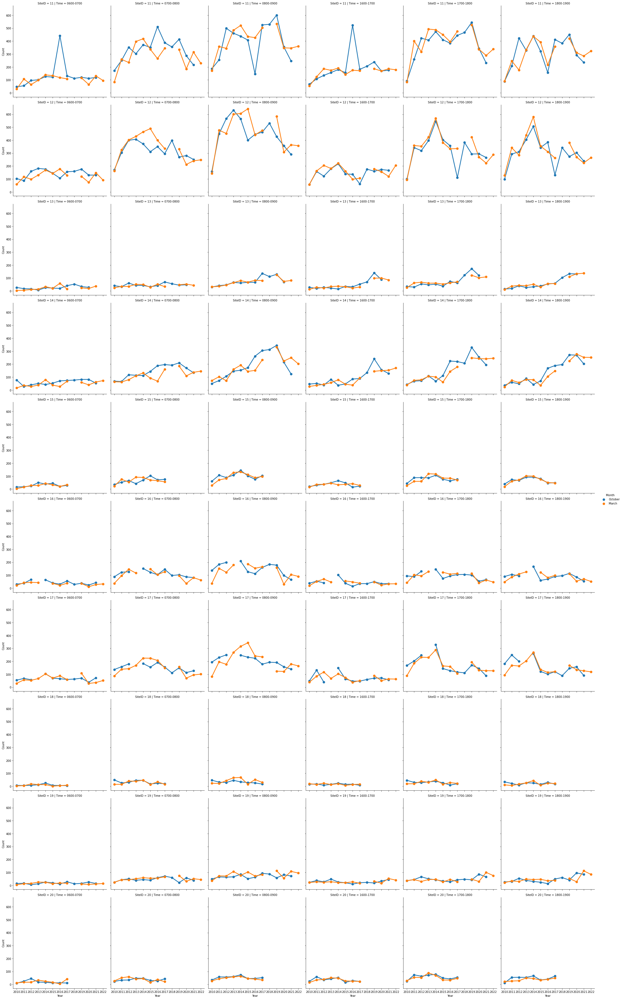

In [51]:
# Repeat the faceted plots for SiteIDs 21-110.
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >10 & SiteID<21"))

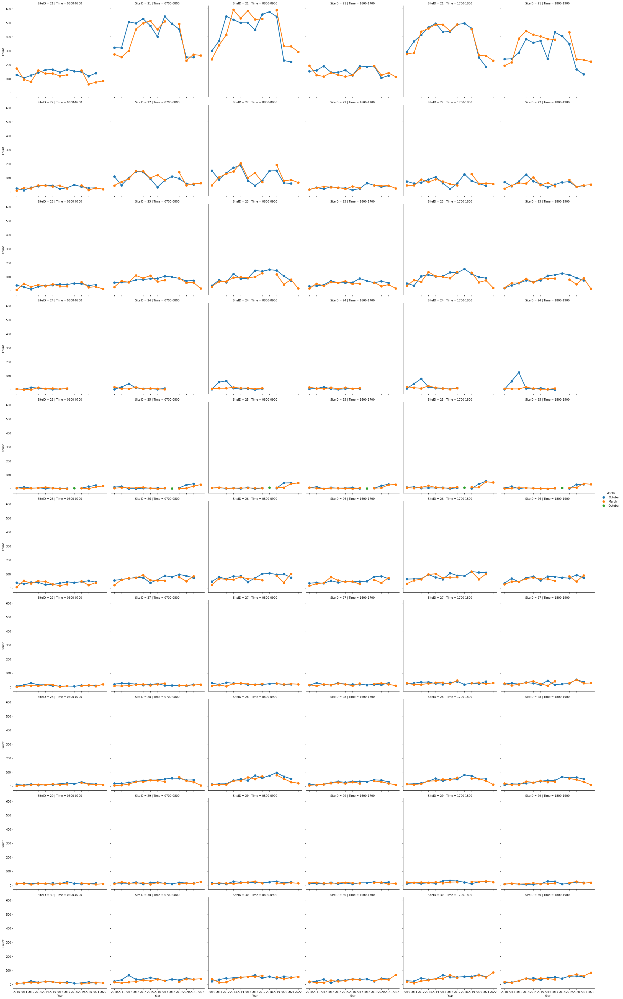

In [52]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >20 & SiteID<31"))

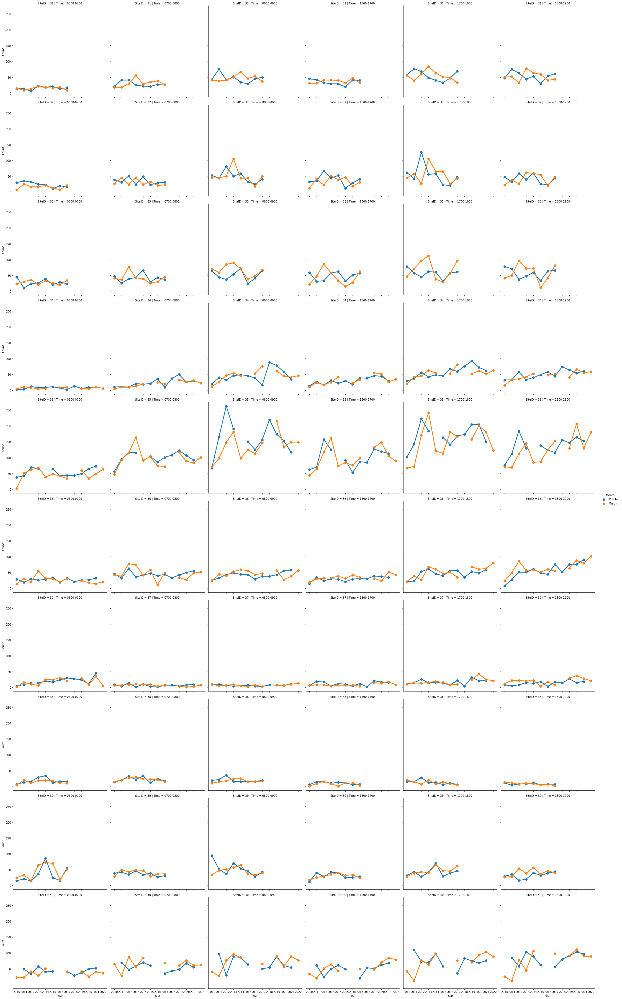

In [53]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >30 & SiteID<41"))

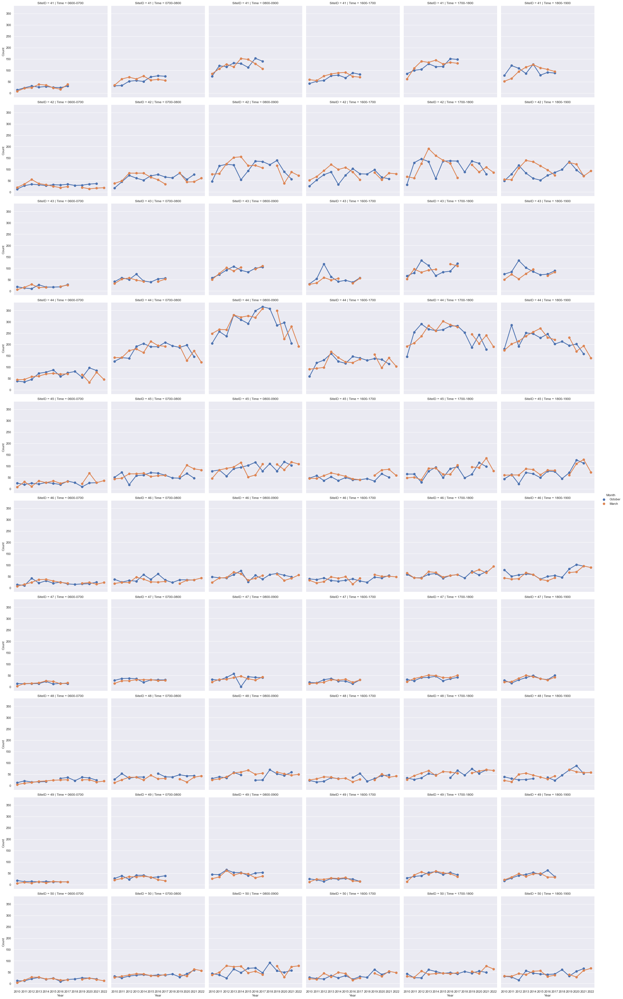

In [55]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >40 & SiteID<51"))

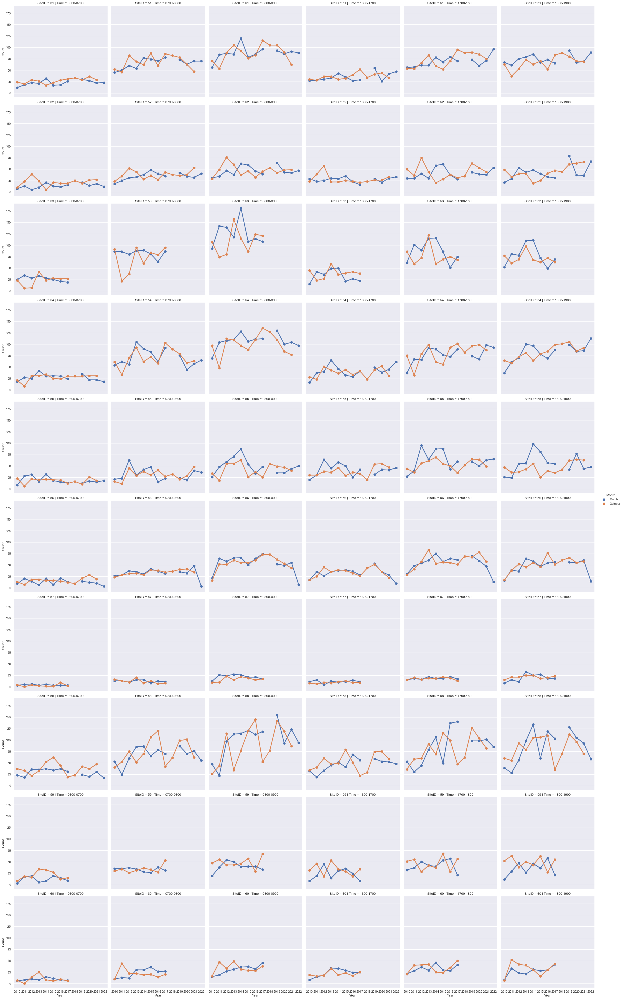

In [56]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >50 & SiteID<61"))

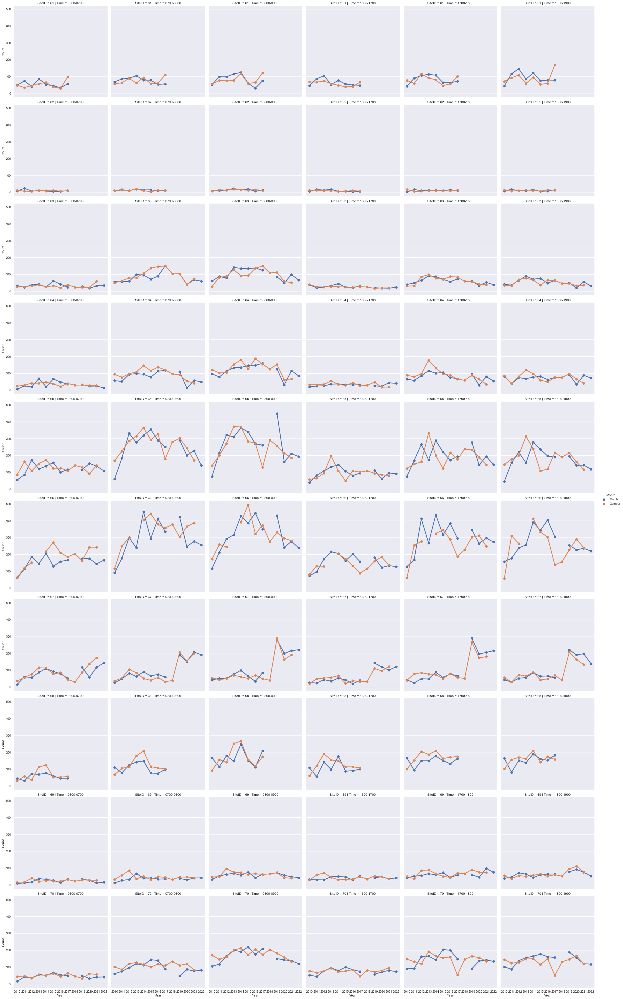

In [57]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >60 & SiteID<71"))

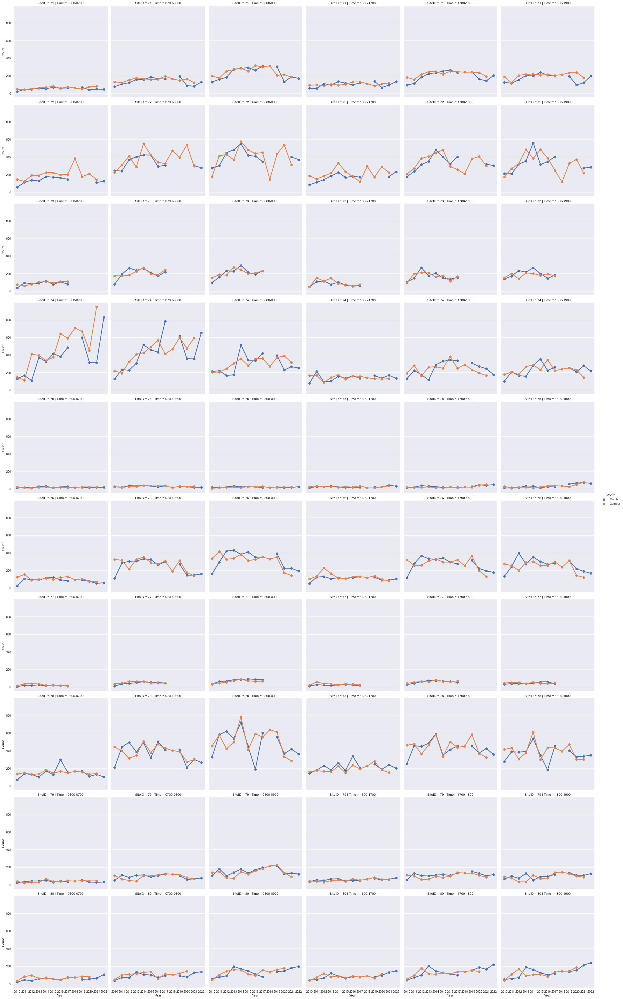

In [58]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >70 & SiteID<81"))

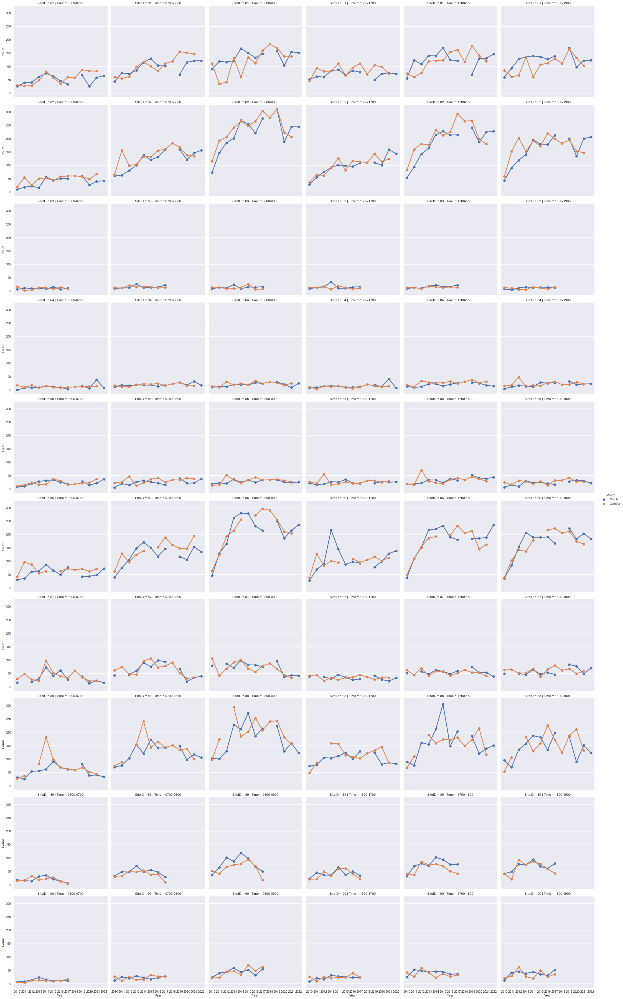

In [59]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >80 & SiteID<91"))

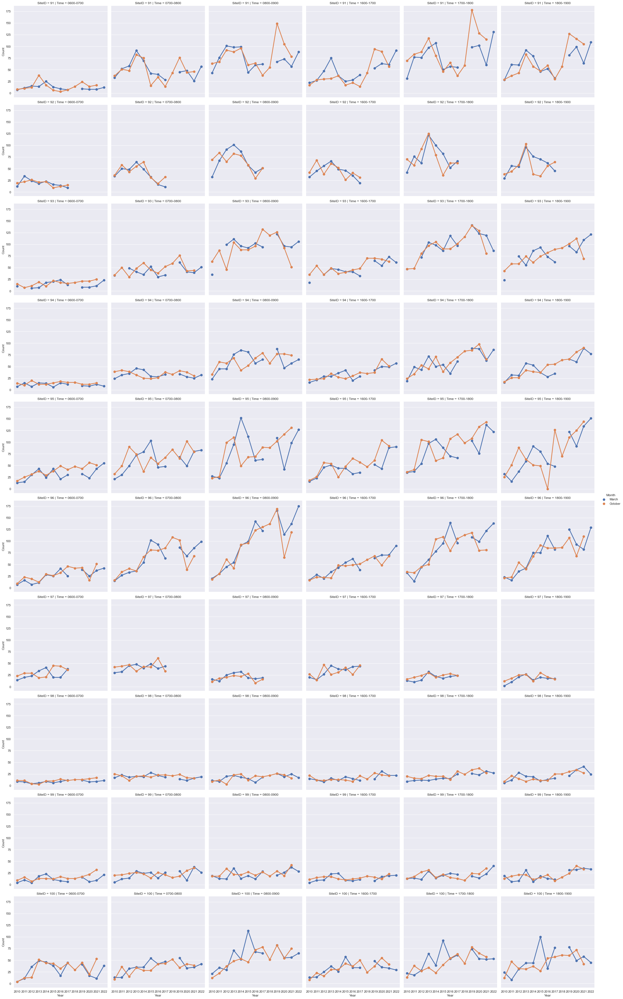

In [60]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >90 & SiteID<101"))

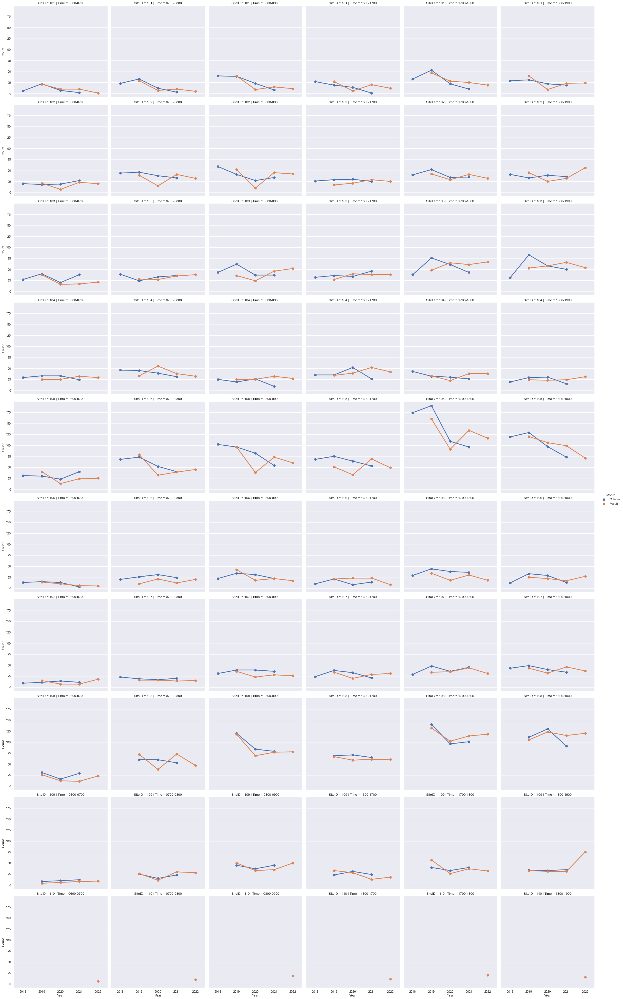

In [61]:
bicycle_merge2_catplot = sns.catplot(
                            x="Year",
                            y= "Count",
                            row= "SiteID",
                            col= "Time",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >100 & SiteID<111"))

Observations of siteID 20-110: Similar trends to siteIDs 1-10. Notably it is clear which sites are popular and which ones aren't (ie the ones with less than 100 cyclist counts, and remain under 100, over the years for a specified time frame). Interestingly there are outliers and variations - eg site 58. 

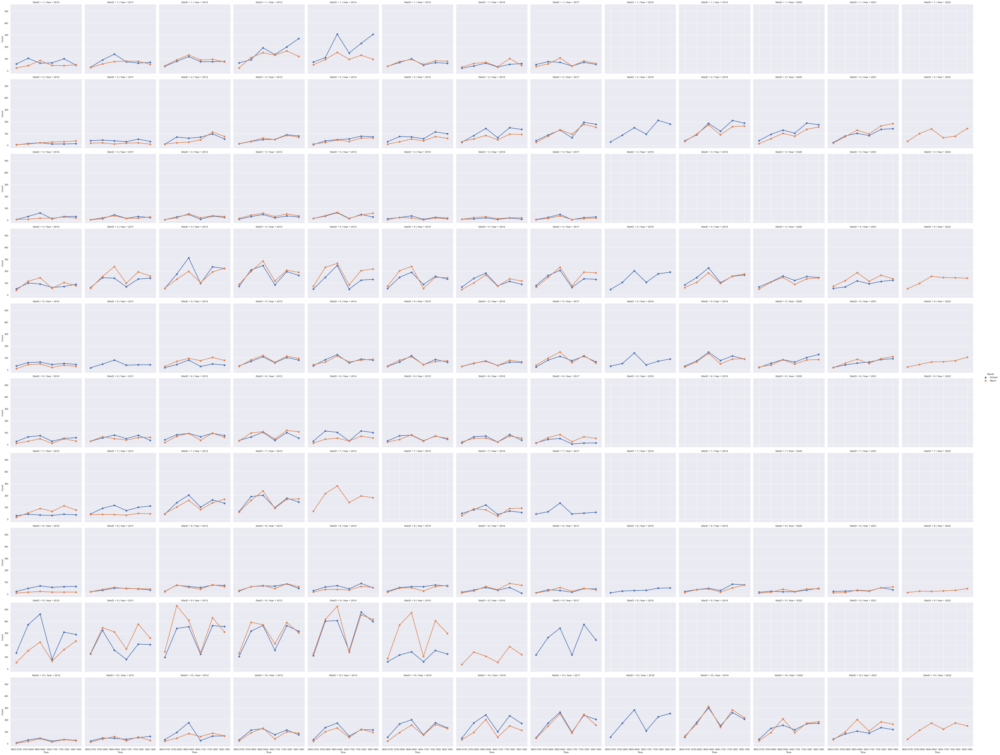

In [88]:
# Generalised plot showing effect of time on number of cylcists across the years.
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID <11"))

Observations. Similar trends in number of cyclists across March and October. Weak positive realtionship with number of cyclists as time increases (from 6am-9am and 4pm-6pm). Missing data prevalent as some sites do not have specific month or year data.

In [ ]:
# Generalised plot showing effect of time on number of cylcists
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >10 & SiteID<21"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >20 & SiteID<31"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >30 & SiteID<41"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >40 & SiteID<51"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >50 & SiteID<61"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >60 & SiteID<71"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >70 & SiteID<81"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >80 & SiteID<91"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >90 & SiteID<101"))

In [ ]:
bicycle_merge2_catplot = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "SiteID",
                            col= "Year",
                            kind="point",
                            hue="Month",
                            data=bicycle_merge2.query("SiteID >100 & SiteID<111"))

# Side by Side barplot showing total count over year and month per site ID

<AxesSubplot:xlabel='Year', ylabel='TotalCount'>

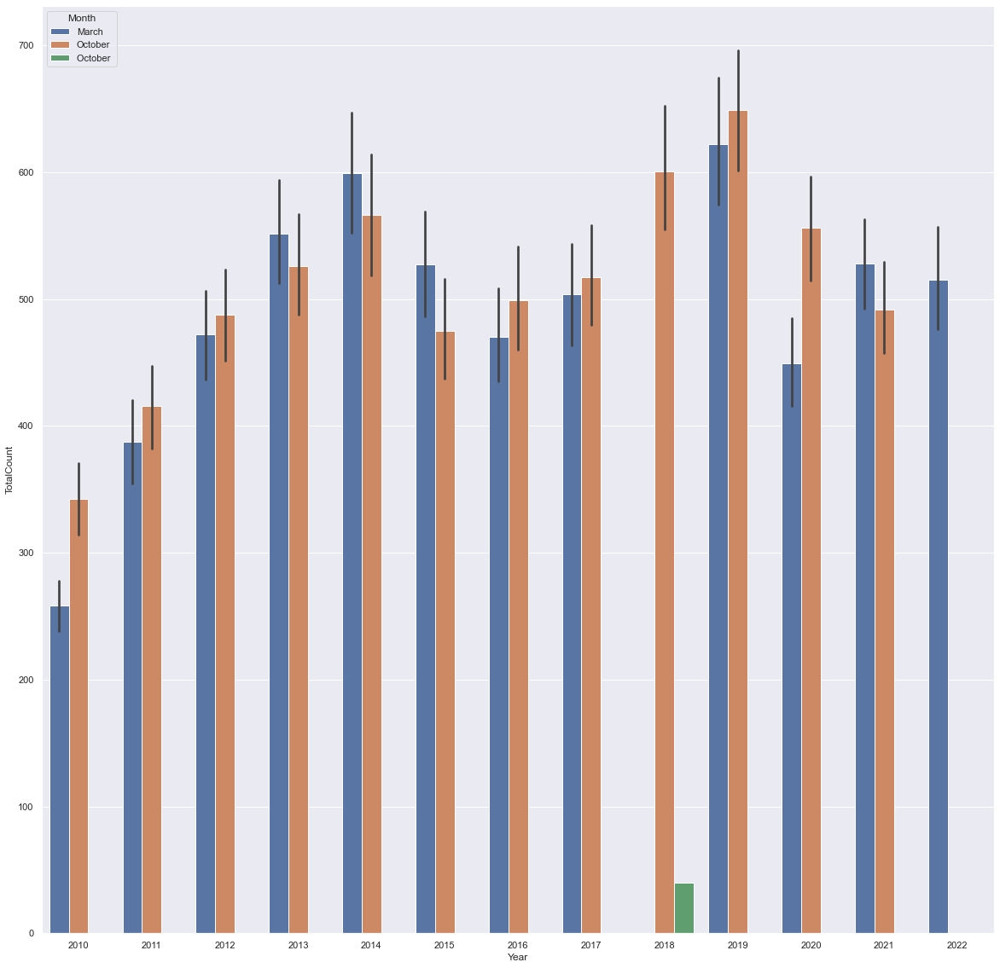

In [63]:
sns.set(rc={"figure.figsize":(20, 20)})
sns.barplot(x="Year",
           y="TotalCount",
           hue="Month",
           data=bicycle_merge2)

Clearly there is one October value which has a whitespace (the green bar) -  as verified on Excel. 


In [66]:
# Remove the erroneous data set.
bicycle_merge2 = bicycle_merge2.replace("October ","October")

<AxesSubplot:xlabel='Year', ylabel='TotalCount'>

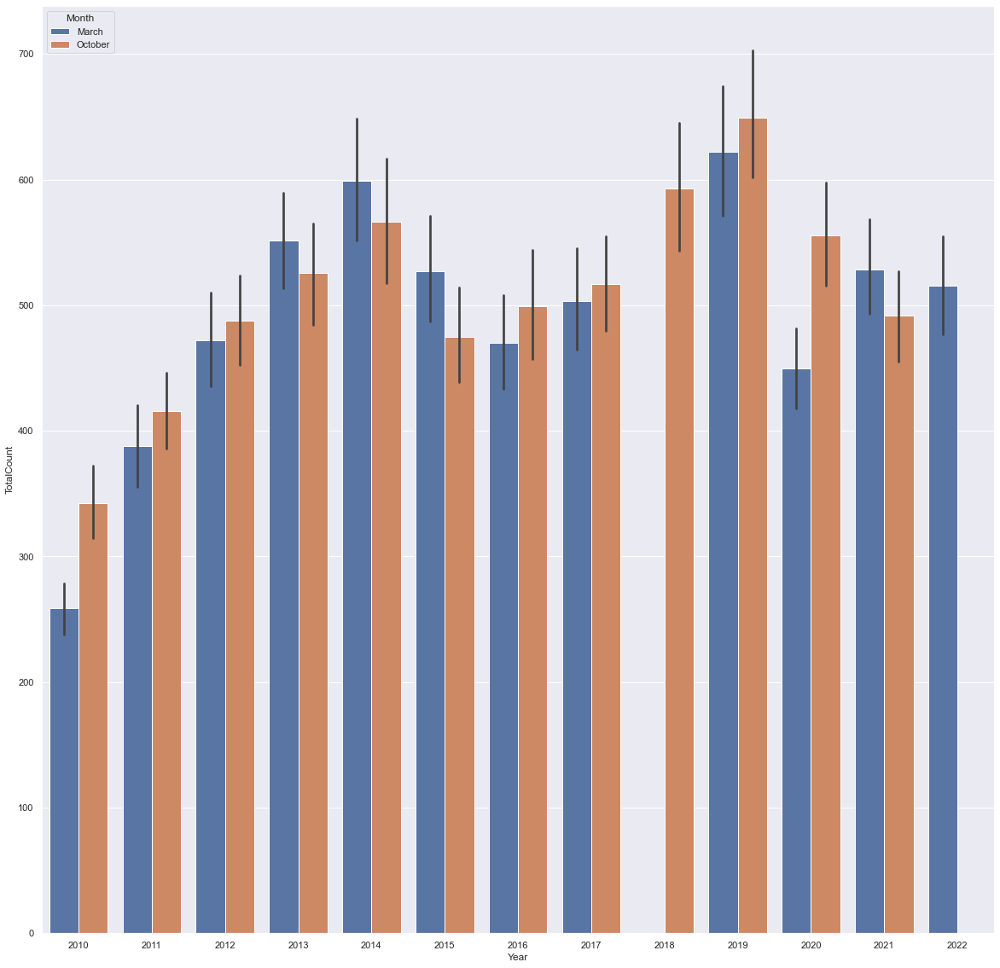

In [67]:
# Replot the barchart.
sns.set(rc={"figure.figsize":(20, 20)})
sns.barplot(x="Year",
           y="TotalCount",
           hue="Month",
           data=bicycle_merge2)

In [ ]:
sns.set(rc={"figure.figsize":(20, 20)})
ax = sns.barplot(x="Year",
           y="TotalCount",
           hue="Month",
           data=bicycle_merge2)

abs_values = bicycle_merge2['TotalCount']
lbls = [f'p[0]' for p in abs_values]

for bars in ax.containers:
        ax.bar_label(bars, fmt='%.1f', labels=lbls)
        
# Tried to add data labels but failed.

Observations and Insights:The number of cyclists peak in 2014, before dipping till 2016. Data is missing for 2018. Surprisingly 2020 levels are close to pre-covid times (see 2012, 2016); the difference could be due to lack of initiatives during these pre-covid years. Have to do more research to find out why. Appears that the number of cyclists are beginning to peak from 2020 onwards.

Similar trends can be seen in October, except for 2021, where the total number of cyclists was less than in 2020.
Interestingly there isn't a  single clear seasonal variation - in certain years October had more cyclists than March, and vice versa in other years. Could other non-seasonal factors have affected the number of cyclists?

# Boxplots faceted by time

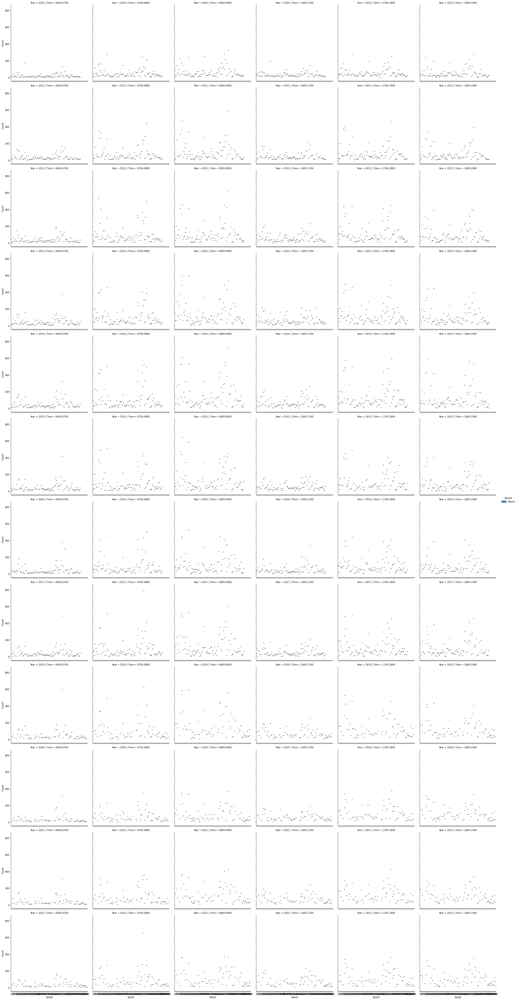

In [89]:
bicycle_merge2_catplot = sns.catplot(
                            x="SiteID",
                            y= "Count",
                            row= "Year",
                            col= "Time",
                            kind="box",
                            hue="Month",
                            data=bicycle_merge2[bicycle_merge2["Month"]=="March"])

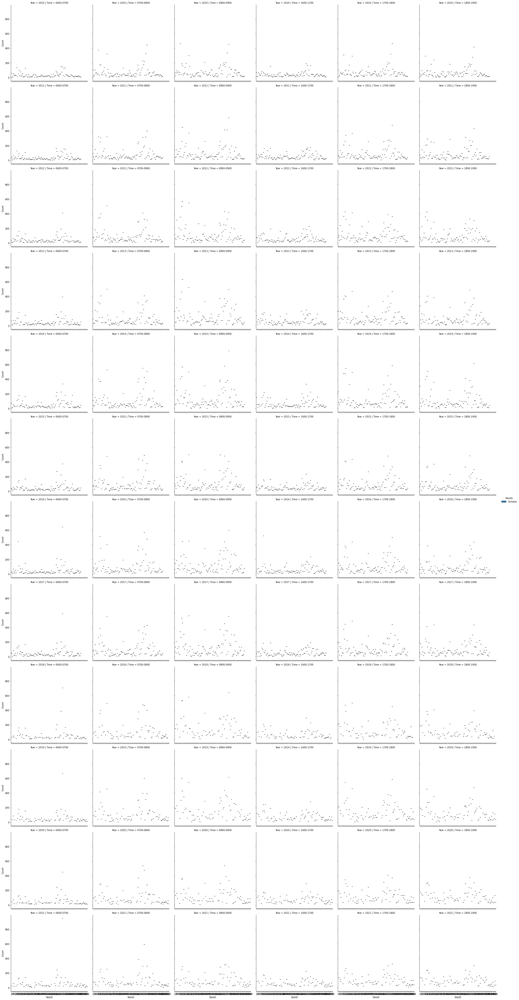

In [90]:
bicycle_merge2_catplot = sns.catplot(
                            x="SiteID",
                            y= "Count",
                            row= "Year",
                            col= "Time",
                            kind="box",
                            hue="Month",
                            data=bicycle_merge2[bicycle_merge2["Month"]=="October"])

I thought a boxplot would make it easy to compare any outliers or the data distribution between siteIDs but there are too many siteIDs to compare. I have opted to use the counts across all siteIDs and use the boxplots.

We can also reuse the code snippets from the scatterplots to make these boxplots.

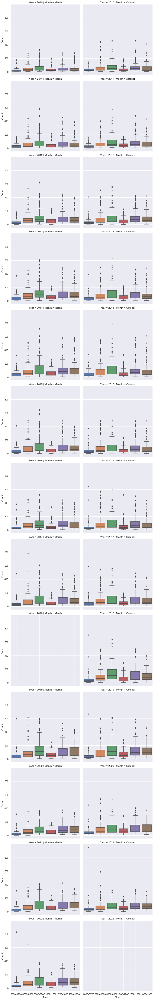

In [90]:
bicycle_merge2_catplot_box = sns.catplot(
                            x="Time",
                            y= "Count",
                            row= "Year",
                            col= "Month",
                            kind="box",
                            data=bicycle_merge2)

Observations: Almost consistent outliers and higher median values for timings in 7am-9am compared to 6-7am, corroborating previous observations. Same pattern shows across 4-7pm.

Unique outliers:
2017, Mar, 7-8am
2018, Oct, 6-7am
2021, oct, 6-7am. 
2022, Mar, 6-7am. 

Could these outliers have coincided with a mass event, eg a triathlon or peloton of sorts?

# Using multilinear regression to find how each variable influences cycling count

After reviewing the multilinear regression processes, I have decided to use this in R, as R enables us to weigh the influence of each independent variable we are testing against. This helps us decide which ones are the most significant and relates to the business scenario. However before that we need to download the merged dataset as a csv.

In [73]:
# Save the cleaned bicycle merge csv file.
bicycle_merge2.to_csv("bicycle_merge2.csv")

# Creating interactive maps on Python

https://infopython.com/how-to-plot-longitude-and-latitude-data-using-python/

In [ ]:
plt.scatter(x=bicycle_site[X],y=bicycle_site[Y])

# Additional factors which could affect cylcing uptake

Resources:
- https://www.cityofsydney.nsw.gov.au/strategies-action-plans/cycling-strategy-and-action-plan
- https://cyclingincities.spph.ubc.ca/
- https://cyclingincities.spph.ubc.ca/motivating-cycling/opinion-survey/
- https://link.springer.com/article/10.1007/s11116-010-9269-x
- https://www.researchgate.net/publication/332383932_Factors_influencing_the_cycling_level_in_cities_-_international_comparison_and_literature_overview
- http://www.ncts.upd.edu.ph/tssp/wp-content/uploads/2019/09/TSSP2019-04_Factors-Influencing-Bicycle-Use-in-a-Medium-Sized-City-the-Case-of-Iloilo-1-City-Philippines.pdf

Ideas
- remove outliers and then conduct analysis
- spatial data: tableau or ARCGIS
- remove site id 110 as it doesn’t exist
- maybe use a dashboard on tableau

things left to do:
- MLR
- research
- outlier analysis
- data reliability, homoscedascity, skewness, kurtosis, etc.


Notes from meeting with Javier, Atif and vanessa.

NY syd --> necessary location is relevant 
sydney 3rd -research strategy divided in areas london, inner cities
modern data --> keep it high level
mar n oct similar weather >> n compare xtrapolation
n also xtrapolate to popln

strategy --> initiative pln divided by areas
** yes we'lll be hv to seperate dataset 
sidney 
mke selectn of areas to compare to central london
real proj
agencies
send an ewmail

data analyst
private, hires etc
2 mtgs w d guys
grab by ourselves
freq diagram - to see mar 

part of research 
gonna come to compare freq
hoe represtntative is d sample

ppt uploaded on github
actn plan
thouhgtwrks mtg>> announcedmt
thoughtwrks 2x a project 

one in 3rd wk n 4th n 5th
norah might nt help datasets

ccling or strategy fr sydney
see if they hv areas n implmntatn plns
timeline
base dproject on tht
on a timeline
jz on case i cnt do it
bznz qns fr d projects
5 whys 

template fr projct to put evrythg 
modify templt

revise 
frmat n academic structure
we r all happy w d frmat
jz tell d guys. 